Original setting

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


# Setting

In [0]:
!pwd
import os
os.chdir("/content/drive/My Drive/Colab Notebooks/M6/week5")
!ls
!pwd

/content
detections_all_camera_1.pkl  detectron2_pre_trained.ipynb
detectron2_fine_tune.ipynb   output1
/content/drive/My Drive/Colab Notebooks/M6/week5


In [0]:
%tensorflow_version 1.x

TensorFlow 1.x selected.


# Install detectron2

In [0]:
# install dependencies: (use cu100 because colab is on CUDA 10.0)
!pip install -U torch==1.4+cu100 torchvision==0.5+cu100 -f https://download.pytorch.org/whl/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
torch.__version__
!gcc --version
# opencv is pre-installed on colab

Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |████████████████████████████████| 723.9MB 24kB/s 
     |████████████████████████████████| 4.1MB 20.9MB/s 
  Found existing installation: torch 1.4.0
    Uninstalling torch-1.4.0:
      Successfully uninstalled torch-1.4.0
  Found existing installation: torchvision 0.5.0
    Uninstalling torchvision-0.5.0:
      Successfully uninstalled torchvision-0.5.0
     |████████████████████████████████| 276kB 2.8MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp36-cp36m-linux_x86_64.whl size=44074 sha256=cf2b48cc66e9e4d984c15750c229f2c9e3f10cd2da7cf6c4f599becbddab6cda
  Stored in directory: /root/.cache/pip/wheels/ad/56/bc/1522f864feb2a358ea6f1a92b4798d69ac783a28e80567a18b
Successfully built pyyaml
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-7p1mabwv
  Running command git 

In [0]:
# install detectron2:
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu100/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu100/index.html
     |████████████████████████████████| 6.2MB 712kB/s 
  Created wheel for fvcore: filename=fvcore-0.1.dev200409-cp36-none-any.whl size=38762 sha256=60157674e0cff53da257bf399e3264f23c038ae58f41a7cd8c500341eb3344a2
  Stored in directory: /root/.cache/pip/wheels/bb/3b/30/8b6e0052b2b657a8a92be715cf417ef59c5977f102cfb60398
Successfully built fvcore


# import

In [0]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger

import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

In [0]:
import tensorflow
tensorflow.__version__

'1.15.2'

# The function of loading data


In [0]:
import os
import glob

class AICityIterator:
    datasetStructure = {
        'S01': ['c001', 'c002', 'c003', 'c004', 'c005'],
        'S03': ['c010', 'c011', 'c012', 'c013', 'c014', 'c015'],
        'S04': ['c016', 'c018', 'c020', 'c022', 'c024', 'c026', 'c028', 
            'c030', 'c032', 'c034', 'c036', 'c038', 'c040','c017', 
            'c019', 'c021', 'c023', 'c025', 'c027', 'c029', 'c031', 'c033', 'c035', 'c037', 'c039']
    }

    def __init__(self, seq, camera, videoLength=None):
        if os.path.exists('Datasets/AIC20_track3/train/'):
            self.baseDir = 'Datasets/AIC20_track3/train/'
        elif os.path.exists('../Datasets/AIC20_track3/train/'):
            self.baseDir = '../Datasets/AIC20_track3/train/'
        else:
            raise Exception("Dataset folder not found")

        if seq not in self.datasetStructure.keys():
            raise Exception('Invalid sequence: ' + seq)

        if camera not in self.datasetStructure[seq]:
            raise Exception('Invalid camera ' + camera + ' for sequence ' + seq)

        datasetDir = self.baseDir + seq + '/' + camera + '/frames/'
        self.frameFiles = glob.glob(datasetDir + '*.jpg')
        self.frameFiles = sorted(self.frameFiles)
        self.limit = videoLength if videoLength is not None else len(self.frameFiles)
        self.currItem = -1

    def __iter__(self):
        return self

    def __next__(self):
        self.currItem += 1
        if self.currItem < self.limit:
            return self.frameFiles[self.currItem]
        raise StopIteration


# for imgPath in AICityIterator("S04", "c016"):
#     print(imgPath)


In [0]:
import os
import glob


def getDictFromDetection(detectionStr, isGT=False):
    detectionList = detectionStr.split(",")
    detectionDict = {}
    detectionDict['frame'] = int(float(detectionList[0]))
    detectionDict['left'] = int(float(detectionList[2]))
    detectionDict['top'] = int(float(detectionList[3]))
    detectionDict['width'] = int(float(detectionList[4]))
    detectionDict['height'] = int(float(detectionList[5]))
    if isGT is not True:
        detectionDict['confidence'] = float(detectionList[6])
    return detectionDict


def get_gt_txt(seq, cam):
    datasetStructure = {
        'S01': ['c001', 'c002', 'c003', 'c004', 'c005'],
        'S03': ['c010', 'c011', 'c012', 'c013', 'c014', 'c015'],
        'S04': ['c016', 'c018', 'c020', 'c022', 'c024', 'c026', 'c028', 'c030', 'c032', 'c034', 'c036', 'c038', 'c040','c017', 'c019', 'c021', 'c023', 'c025', 'c027', 'c029', 'c031', 'c033', 'c035', 'c037', 'c039']
    }

    if os.path.exists('Datasets/AIC20_track3/train/'):
        baseDir = 'Datasets/AIC20_track3/train/'
    elif os.path.exists('../Datasets/AIC20_track3/train/'):
        baseDir = '../Datasets/AIC20_track3/train/'
    else:
        raise Exception("Dataset folder not found")

    if seq not in datasetStructure.keys():
        raise Exception('Invalid sequence: ' + seq)

    if cam not in datasetStructure[seq]:
        raise Exception('Invalid camera ' + cam + ' for sequence ' + seq)

    gtFilePath = baseDir + seq + '/' + cam + '/gt/gt.txt'

    detections = []
    with open(gtFilePath, 'r') as f:
        for line in f:
            splitStr = line.split(',')
            currFrame = int(splitStr[0])
            detections.append(getDictFromDetection(line, True))

    det_frames = []
    last_frame = 0
    det_one_frame = []
    for detection in detections:
        if detection['frame'] != last_frame:
            for current_frame in range(last_frame, detection['frame']):
                if current_frame != 0:
                    det_frames.append(det_one_frame)
                det_one_frame = []
        det_one_frame.append(detection)
        last_frame = detection['frame']
    
    det_frames.append(det_one_frame)

    return det_frames

# gt_txt = get_gt_txt("S01", "c001")
# print(gt_txt)
# print(len(gt_txt))
# print(gt_txt[-3])

# Register the dataset for detectron2

In [0]:
datasetStructure = {
    'S01': ['c001', 'c002', 'c003', 'c004', 'c005'],
    'S03': ['c010', 'c011', 'c012', 'c013', 'c014', 'c015'],
    'S04': ['c016', 'c018', 'c020', 'c022', 'c024', 'c026', 'c028', 'c030', 'c032', 'c034', 'c036', 'c038', 'c040','c017', 'c019', 'c021', 'c023', 'c025', 'c027', 'c029', 'c031', 'c033', 'c035', 'c037', 'c039']
}
training_dataset = ['S01', 'S04']
testing_dataset = ['S03']

In [0]:
# if your dataset is in COCO format, this cell can be replaced by the following three lines:
# from detectron2.data.datasets import register_coco_instances
# register_coco_instances("my_dataset_train", {}, "json_annotation_train.json", "path/to/image/dir")
# register_coco_instances("my_dataset_val", {}, "json_annotation_val.json", "path/to/image/dir")

import os
import numpy as np
import json
from detectron2.structures import BoxMode
from pycocotools.mask import toBbox, decode
import cv2

from tqdm import tqdm


def register_from_dataset(dataset_path, dataset):

    dataset_dicts = []
    idx = 0
    for seq in dataset:
      cam_list = datasetStructure[seq]
      for cam in cam_list:
        # print (seq, cam)
        gt_txt = get_gt_txt(seq, cam)
        new_cam = True
        for imgPath in AICityIterator(seq, cam):
          print (imgPath)
          frame = int(imgPath.split("/")[-1].split(".")[0])

          if (frame-1) < len(gt_txt):
            v = gt_txt[frame-1]
          else:
            v = []
          # print(v)

          record = {}
          
          # read image takes a long time if there are a lot images.
          if new_cam:
            height, width = cv2.imread(imgPath).shape[:2]
            new_cam = False

          record["file_name"] = imgPath
          record["image_id"] = idx
          idx = idx + 1
          record["height"] = height
          record["width"] = width

          objs = []
          for instance in v:
              
            box = [instance['left'], instance['top'], instance['left'] + instance['width'], instance['top'] + instance['height']]
            px = [box[0], box[2], box[2], box[0]]
            py = [box[1], box[1], box[3], box[3]]
            poly = [(x + 0.5, y + 0.5) for x, y in zip(px, py)] 
            poly = [xy for point in poly for xy in point]
            obj = {
                "bbox": box,
                "bbox_mode": BoxMode.XYXY_ABS,
                "segmentation": [poly],
                "category_id": 0,
                "iscrowd": 0
            }
            objs.append(obj)
          record["annotations"] = objs
          dataset_dicts.append(record)
          # if len(dataset_dicts) > 100:
          #   return dataset_dicts
    return dataset_dicts


from detectron2.data import DatasetCatalog, MetadataCatalog

dataset_path = "../Datasets/AIC20_track3/train/"

thing_classes = ['Car']

# g = lambda: register_from_dataset(dataset_path, training_dataset)
# g()


In [0]:
DatasetCatalog.register("AI_City_training", lambda: register_from_dataset(dataset_path, training_dataset))
MetadataCatalog.get("AI_City_training").set(thing_classes=thing_classes)
DatasetCatalog.register("AI_City_val", lambda: register_from_dataset(dataset_path, testing_dataset))
MetadataCatalog.get("AI_City_val").set(thing_classes=thing_classes)

AI_City_metadata = MetadataCatalog.get("AI_City_training")

In [0]:
dataset_dicts = register_from_dataset(dataset_path, training_dataset)

流式输出内容被截断，只能显示最后 5000 行内容。
../Datasets/AIC20_track3/train/S04/c040/frames/00267.jpg
../Datasets/AIC20_track3/train/S04/c040/frames/00268.jpg
../Datasets/AIC20_track3/train/S04/c040/frames/00269.jpg
../Datasets/AIC20_track3/train/S04/c040/frames/00270.jpg
../Datasets/AIC20_track3/train/S04/c040/frames/00271.jpg
../Datasets/AIC20_track3/train/S04/c040/frames/00272.jpg
../Datasets/AIC20_track3/train/S04/c040/frames/00273.jpg
../Datasets/AIC20_track3/train/S04/c040/frames/00274.jpg
../Datasets/AIC20_track3/train/S04/c040/frames/00275.jpg
../Datasets/AIC20_track3/train/S04/c040/frames/00276.jpg
../Datasets/AIC20_track3/train/S04/c040/frames/00277.jpg
../Datasets/AIC20_track3/train/S04/c040/frames/00278.jpg
../Datasets/AIC20_track3/train/S04/c040/frames/00279.jpg
../Datasets/AIC20_track3/train/S04/c040/frames/00280.jpg
../Datasets/AIC20_track3/train/S04/c040/frames/00281.jpg
../Datasets/AIC20_track3/train/S04/c040/frames/00282.jpg
../Datasets/AIC20_track3/train/S04/c040/frames/00283.jpg
../D

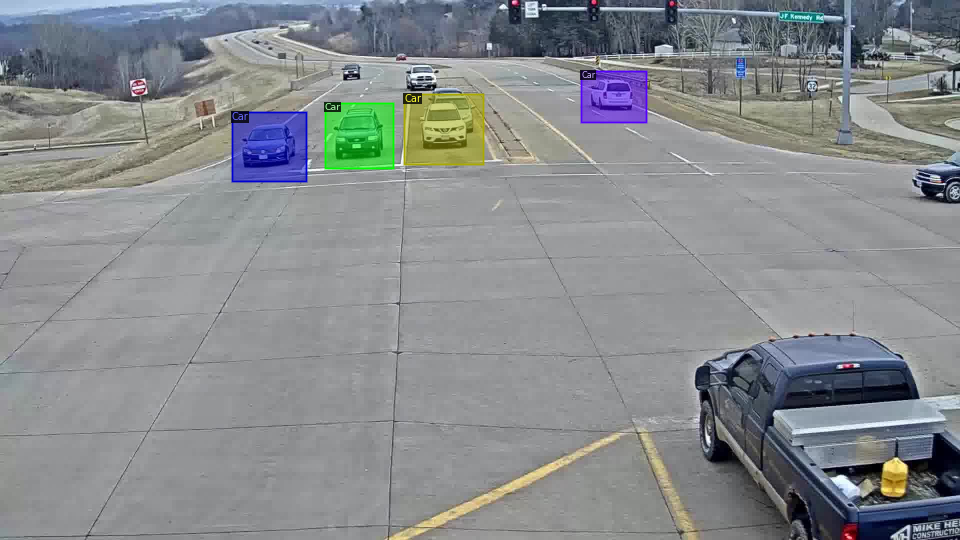

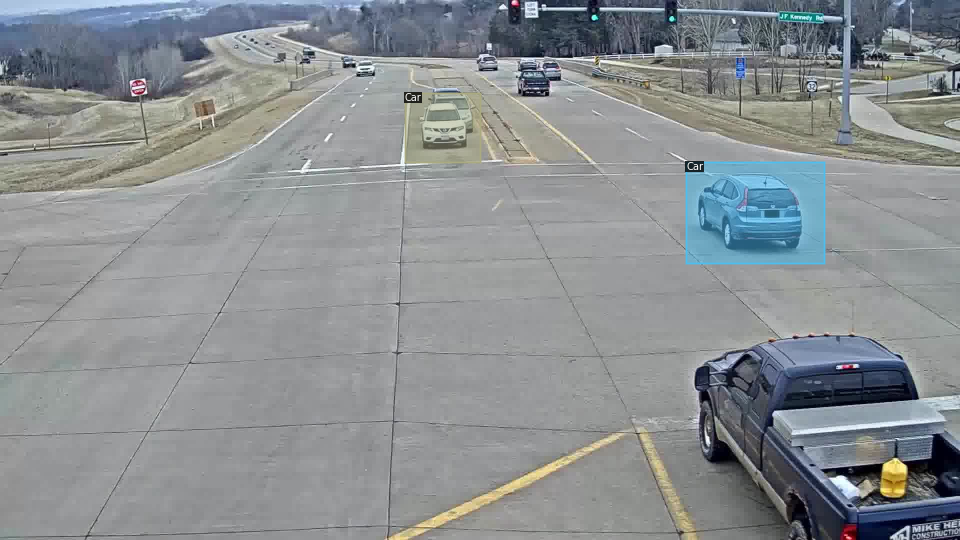

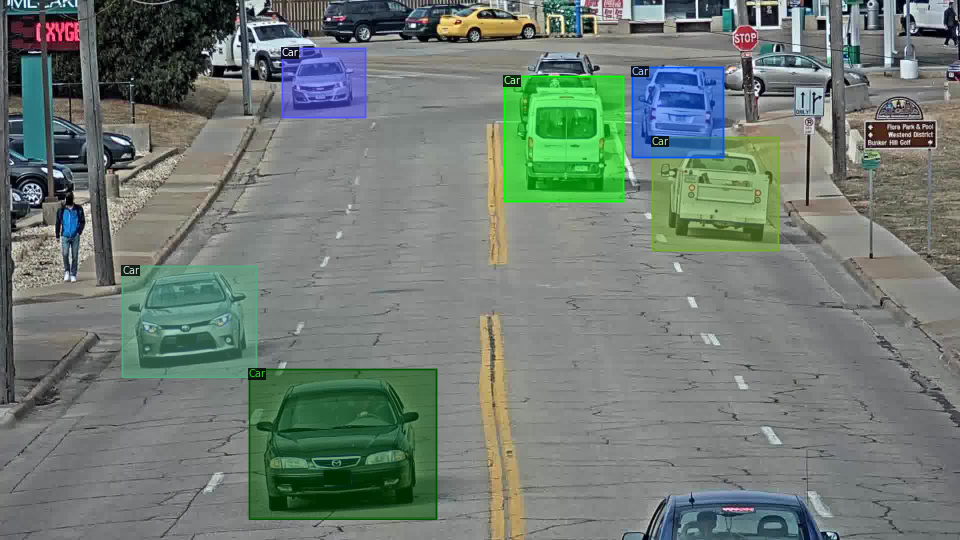

In [0]:
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=AI_City_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

# Train on my dataset

In [0]:
output_path = "./output1/"

In [0]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg

# model_name = "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
model_name = "COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(model_name))
cfg.DATASETS.TRAIN = ("AI_City_training",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(model_name)  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.LR_SCHEDULER_NAME = 'WarmupMultiStepLR'   # 'WarmupMultiStepLR' (default) or 'WarmupCosineLR'
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 5000    # 300 iterations seems good enough for this toy dataset; you may need to train longer for a practical dataset
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon)

cfg.OUTPUT_DIR = output_path


In [0]:
cfg.OUTPUT_DIR

'./output1/'

In [0]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)

In [0]:
trainer.train()

[04/08 21:45:02 d2.engine.train_loop]: Starting training from iteration 0
[04/08 21:45:09 d2.utils.events]:  eta: 0:25:56  iter: 19  total_loss: 1.284  loss_cls: 0.636  loss_box_reg: 0.531  loss_rpn_cls: 0.049  loss_rpn_loc: 0.018  time: 0.3153  data_time: 0.0374  lr: 0.000005  max_mem: 2728M
[04/08 21:45:15 d2.utils.events]:  eta: 0:25:43  iter: 39  total_loss: 1.185  loss_cls: 0.595  loss_box_reg: 0.507  loss_rpn_cls: 0.046  loss_rpn_loc: 0.016  time: 0.3131  data_time: 0.0281  lr: 0.000010  max_mem: 2728M
[04/08 21:45:21 d2.utils.events]:  eta: 0:25:50  iter: 59  total_loss: 1.036  loss_cls: 0.527  loss_box_reg: 0.452  loss_rpn_cls: 0.047  loss_rpn_loc: 0.012  time: 0.3147  data_time: 0.0185  lr: 0.000015  max_mem: 2728M
[04/08 21:45:28 d2.utils.events]:  eta: 0:25:42  iter: 79  total_loss: 1.119  loss_cls: 0.473  loss_box_reg: 0.615  loss_rpn_cls: 0.045  loss_rpn_loc: 0.015  time: 0.3140  data_time: 0.0091  lr: 0.000020  max_mem: 2728M
[04/08 21:45:34 d2.utils.events]:  eta: 0:25:3

In [0]:
# Look at training curves in tensorboard:
output_path_split = output_path.split('/')[-2]
print (output_path_split)
%load_ext tensorboard
# %tensorboard --logdir output
%tensorboard --logdir {output_path_split}

output1


ERROR: Failed to launch TensorBoard (exited with 1).
Contents of stderr:
Traceback (most recent call last):
  File "/tensorflow-1.15.2/python3.6/bin/tensorboard", line 8, in <module>
    sys.exit(run_main())
  File "/tensorflow-1.15.2/python3.6/tensorboard/main.py", line 64, in run_main
    app.run(tensorboard.main, flags_parser=tensorboard.configure)
  File "/usr/local/lib/python3.6/dist-packages/absl/app.py", line 299, in run
    _run_main(main, args)
  File "/usr/local/lib/python3.6/dist-packages/absl/app.py", line 250, in _run_main
    sys.exit(main(argv))
  File "/tensorflow-1.15.2/python3.6/tensorboard/program.py", line 220, in main
    server = self._make_server()
  File "/tensorflow-1.15.2/python3.6/tensorboard/program.py", line 301, in _make_server
    self.assets_zip_provider)
  File "/tensorflow-1.15.2/python3.6/tensorboard/backend/application.py", line 150, in standard_tensorboard_wsgi
    flags, plugin_loaders, data_provider, assets_zip_provider, multiplexer)
  File "/tens

In [0]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
cfg.DATASETS.TEST = ("AI_City_val", )
predictor = DefaultPredictor(cfg)

流式输出内容被截断，只能显示最后 5000 行内容。
../Datasets/AIC20_track3/train/S03/c013/frames/01677.jpg
../Datasets/AIC20_track3/train/S03/c013/frames/01678.jpg
../Datasets/AIC20_track3/train/S03/c013/frames/01679.jpg
../Datasets/AIC20_track3/train/S03/c013/frames/01680.jpg
../Datasets/AIC20_track3/train/S03/c013/frames/01681.jpg
../Datasets/AIC20_track3/train/S03/c013/frames/01682.jpg
../Datasets/AIC20_track3/train/S03/c013/frames/01683.jpg
../Datasets/AIC20_track3/train/S03/c013/frames/01684.jpg
../Datasets/AIC20_track3/train/S03/c013/frames/01685.jpg
../Datasets/AIC20_track3/train/S03/c013/frames/01686.jpg
../Datasets/AIC20_track3/train/S03/c013/frames/01687.jpg
../Datasets/AIC20_track3/train/S03/c013/frames/01688.jpg
../Datasets/AIC20_track3/train/S03/c013/frames/01689.jpg
../Datasets/AIC20_track3/train/S03/c013/frames/01690.jpg
../Datasets/AIC20_track3/train/S03/c013/frames/01691.jpg
../Datasets/AIC20_track3/train/S03/c013/frames/01692.jpg
../Datasets/AIC20_track3/train/S03/c013/frames/01693.jpg
../D

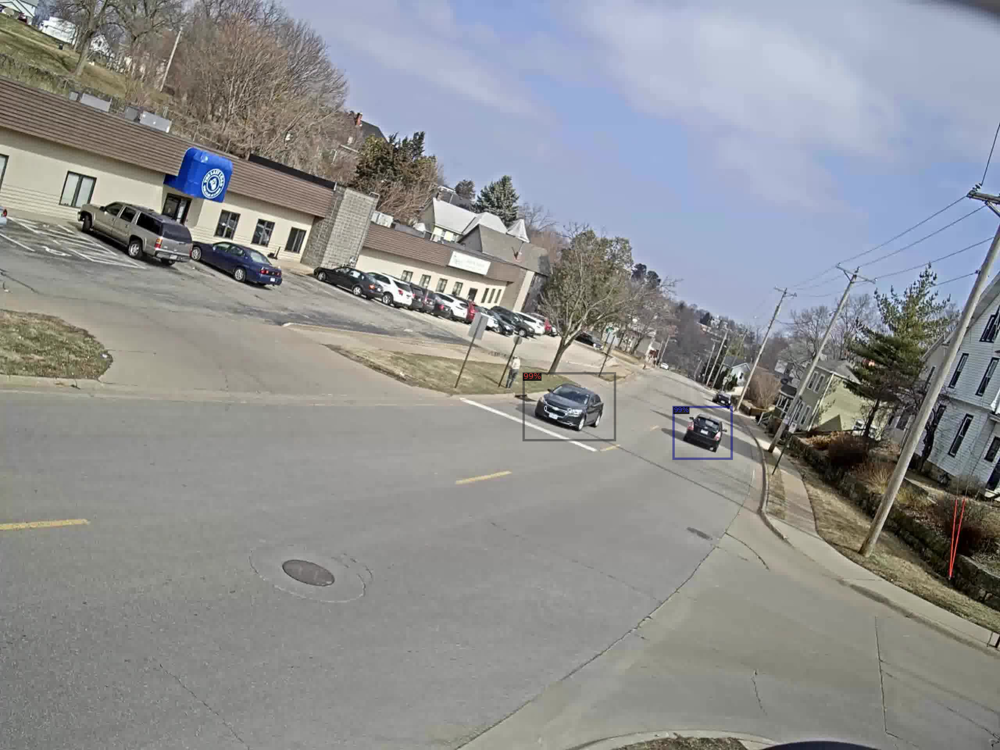

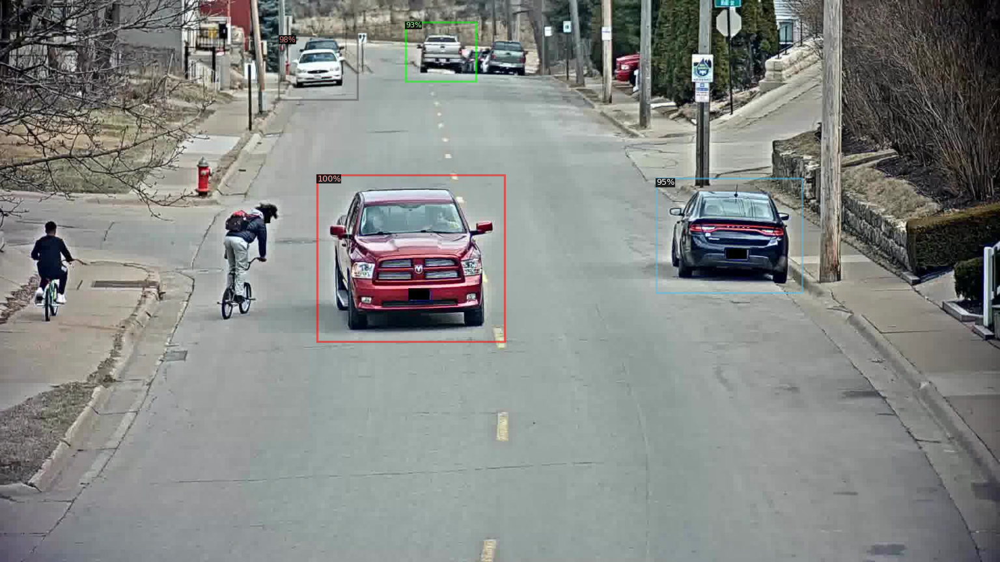

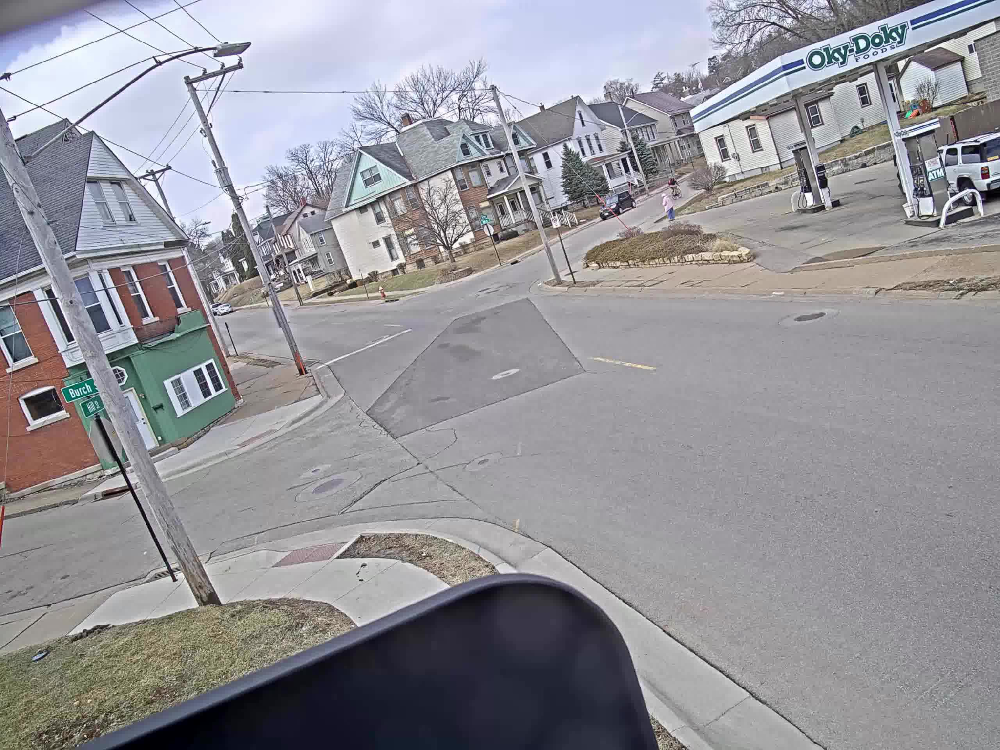

In [0]:
from detectron2.utils.visualizer import ColorMode
import pickle
dataset_dicts = register_from_dataset(dataset_path, testing_dataset)
exmaple_list = random.sample(dataset_dicts,3)

for d in exmaple_list:    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=AI_City_metadata, 
                   scale=0.5, 
                  #  instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

generate the corresponding ground truth

[{'file_name': '../Datasets/AIC20_track3/train/S03/c011/frames/02203.jpg', 'image_id': 4343, 'height': 1920, 'width': 2560, 'annotations': [{'bbox': [1728, 1046, 1875, 1178], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'segmentation': [[1728.5, 1046.5, 1875.5, 1046.5, 1875.5, 1178.5, 1728.5, 1178.5]], 'category_id': 0, 'iscrowd': 0}, {'bbox': [1344, 966, 1562, 1118], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'segmentation': [[1344.5, 966.5, 1562.5, 966.5, 1562.5, 1118.5, 1344.5, 1118.5]], 'category_id': 0, 'iscrowd': 0}]}, {'file_name': '../Datasets/AIC20_track3/train/S03/c010/frames/00887.jpg', 'image_id': 886, 'height': 1080, 'width': 1920, 'annotations': [{'bbox': [776, 41, 915, 164], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'segmentation': [[776.5, 41.5, 915.5, 41.5, 915.5, 164.5, 776.5, 164.5]], 'category_id': 0, 'iscrowd': 0}, {'bbox': [611, 331, 961, 648], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'segmentation': [[611.5, 331.5, 961.5, 331.5, 961.5, 648.5, 611.5, 648.5]], 'category_id': 0, 'iscrowd': 0}

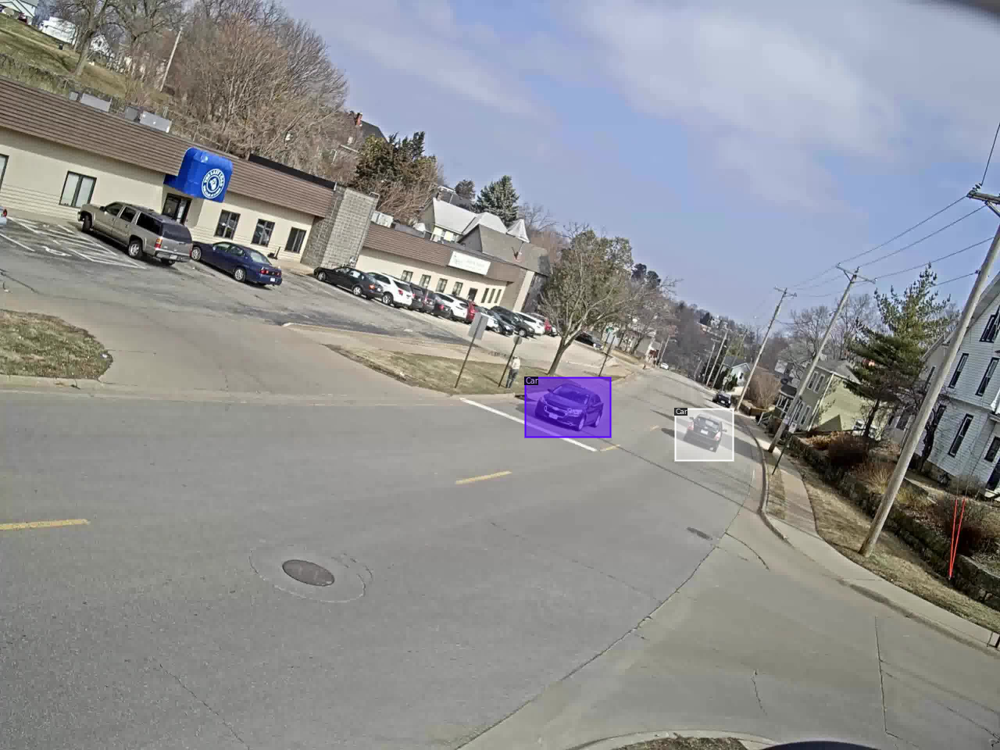

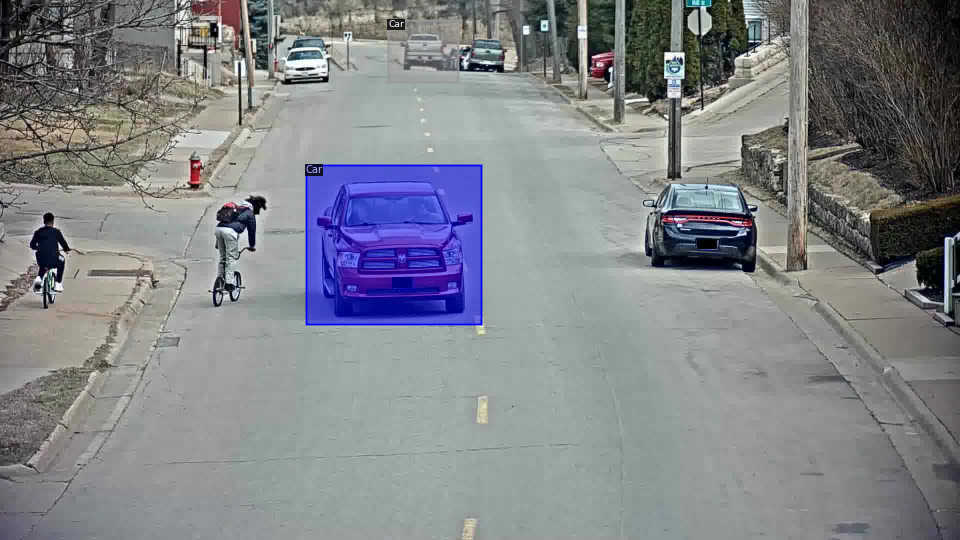

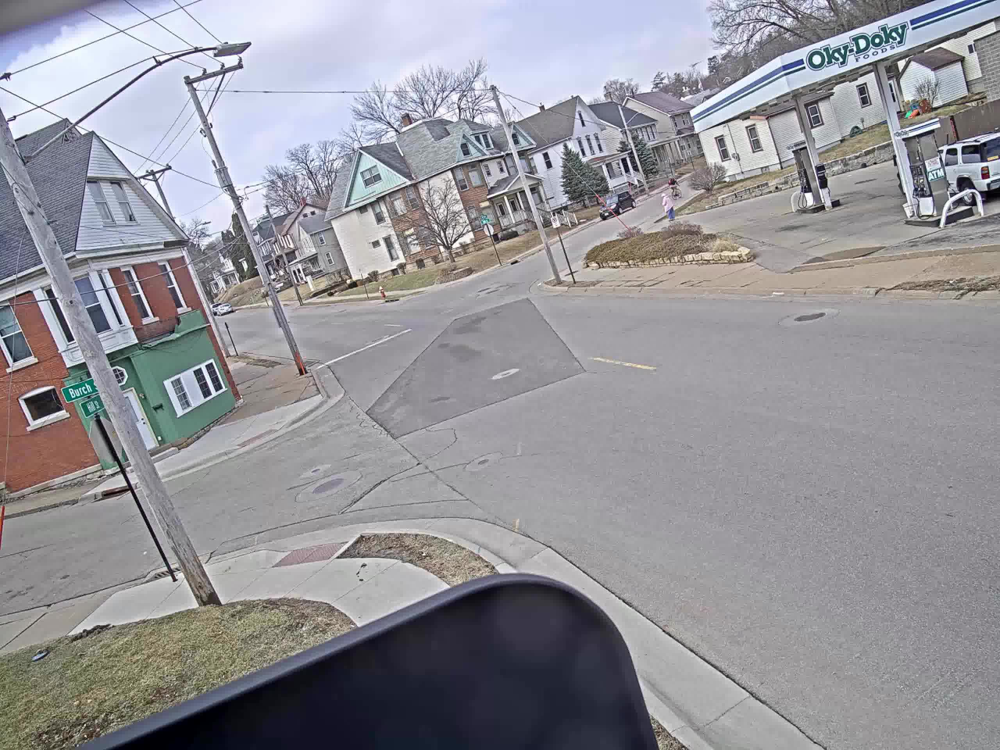

In [0]:
print (exmaple_list)
for d in exmaple_list:
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=AI_City_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [0]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("AI_City_val", cfg, False, output_dir=output_path)
val_loader = build_detection_test_loader(cfg, "AI_City_val")
inference_on_dataset(trainer.model, val_loader, evaluator)
# another equivalent way is to use trainer.test

In [0]:
print(len(evaluator._predictions))
print(evaluator._predictions[0])

13517
{'image_id': 0, 'instances': [{'image_id': 0, 'category_id': 0, 'bbox': [1259.6890869140625, 344.7362976074219, 281.53857421875, 218.37350463867188], 'score': 0.9582200646400452, 'segmentation': [[1259.6890869140625, 344.7362976074219, 1259.6890869140625, 563.1098022460938, 1541.2276611328125, 563.1098022460938, 1541.2276611328125, 344.7362976074219]], 'area': 61480.56514312327, 'id': 1, 'iscrowd': 0}, {'image_id': 0, 'category_id': 0, 'bbox': [536.6636962890625, 72.05327606201172, 147.406494140625, 119.49010467529297], 'score': 0.9572877287864685, 'segmentation': [[536.6636962890625, 72.05327606201172, 536.6636962890625, 191.5433807373047, 684.0701904296875, 191.5433807373047, 684.0701904296875, 72.05327606201172]], 'area': 17613.61741468124, 'id': 2, 'iscrowd': 0}, {'image_id': 0, 'category_id': 0, 'bbox': [909.3696899414062, 64.73945617675781, 121.68145751953125, 101.18511962890625], 'score': 0.3229445219039917, 'segmentation': [[909.3696899414062, 64.73945617675781, 909.36968

In [0]:
# dataset = testing_dataset
# idx = 0
# for seq in dataset:
#     cam_list = datasetStructure[seq]
#     detections = []
#     for cam in cam_list:
#         # print (seq, cam)
#         gt_txt = get_gt_txt(seq, cam)
#         new_cam = True
#         for imgPath in AICityIterator(seq, cam):
#           frame = int(imgPath.split("/")[-1].split(".")[0])
#           if idx != evaluator._predictions[idx]['image_id']:
#             raise raise Exception('Incorrect image_id')
#           outputs = evaluator._predictions[idx]
#           classes = outputs["instances"].pred_classes.to("cpu").numpy()
#           boxes = outputs["instances"].pred_boxes.to("cpu").tensor.numpy()
#           scores = outputs["instances"].scores.to("cpu").numpy()

#           car_index = np.where(classes==2)[0]
#           if len(car_index) > 0:
#               for k in range(car_index.shape[0]):
#                   frame_id = int(frame.split('.')[0])
#                   bbox = boxes[car_index[k]]
#                   score = scores[car_index[k]]
                  
#                   detection = {}
#                   box_w = bbox[2] - bbox[0]
#                   box_h = bbox[3] - bbox[1]
#                   detection['frame'] = frame_id
#                   detection['left'] = bbox[0]
#                   detection['top'] = bbox[1]
#                   detection['width'] = box_w
#                   detection['height'] = box_h
#                   detection['confidence'] = score
#                   detections.append(detection)
#     detections_all_camera[sequence] = detections

In [0]:
from tqdm import tqdm

dataset_location = "../Datasets/AIC20_track3/train/S03/"
detections_all_camera = {}
for sequence in sorted(os.listdir(dataset_location)):
    print (sequence)
    sequence_location = "{}{}/frames/".format(dataset_location, sequence)
    detections = []
    for frame in tqdm(sorted(os.listdir(sequence_location))):
        frame_filename = "{}{}".format(sequence_location, frame)
        im = cv2.imread(frame_filename)
        outputs = predictor(im)

        # print(outputs)
        classes = outputs["instances"].pred_classes.to("cpu").numpy()
        boxes = outputs["instances"].pred_boxes.to("cpu").tensor.numpy()
        scores = outputs["instances"].scores.to("cpu").numpy()

        for k in classes:
            frame_id = int(frame.split('.')[0])
            bbox = boxes[k]
            score = scores[k]
            
            detection = {}
            box_w = bbox[2] - bbox[0]
            box_h = bbox[3] - bbox[1]
            detection['frame'] = frame_id
            detection['left'] = bbox[0]
            detection['top'] = bbox[1]
            detection['width'] = box_w
            detection['height'] = box_h
            detection['confidence'] = score
            detections.append(detection)
    detections_all_camera[sequence] = detections


In [0]:
import pickle
with open("detections_all_camera_fine_tune.pkl", 'wb') as f:
    pickle.dump(detections_all_camera, f)
    f.close()